# Meta-Reinforcement Learning with MAML

In this assignment notebook, we will implement **Model-Agnostic Meta-Learning (MAML)** from scratch for a custom `HalfCheetahBackward` environment. The goal is to learn policy parameters that can quickly adapt to new tasks in this case, running the HalfCheetah agent **backward** with just a few gradient steps. Each section below provides context and key steps.

In [ ]:
!pip -q install gymnasium[mujoco]
!pip install imageio -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.5/243.5 kB 19.4 MB/s eta 0:00:00


## Environment & Dependencies


In [ ]:
import gymnasium as gym
import random
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
from collections import namedtuple, deque
import imageio
from copy import deepcopy
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.func import functional_call
from torch.distributions import Normal
from torch.distributions import Categorical

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')


This is necessary for running the HalfCheetah env on colab.

In [ ]:
%env MUJOCO_GL=egl

env: MUJOCO_GL=egl


This code displays a saved mp4 file.

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def show_video(path):
    mp4 = open(path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML("""
    <video width=400 controls>
          <source src="%s" type="video/mp4">
    </video>
    """ % data_url)

Run this code to get started with the HalfCheetah environment.

In [ ]:
env = gym.make("HalfCheetah-v5", render_mode="rgb_array")
env.reset()
frames = []

for _ in range(100):
    frames.append(env.render())
    action = env.action_space.sample()
    obs, reward, term, trunc, info = env.step(action)
    done = term or trunc
    if done:
        break

env.close()
imageio.mimsave('./HalfCheetah.mp4', frames, fps=20)
show_video('./HalfCheetah.mp4')

We modify the HalfCheetah environment by creating a wrapper on top it to reward the model for moving backwards.

In [ ]:
class HalfCheetahBackward(gym.Env):
    def __init__(self):
        super().__init__()
        self.env = gym.make("HalfCheetah-v5", render_mode="rgb_array")
        self.forward_reward_weight = 1.0
        self.ctrl_cost_weight = 0.05

    def reset(self, *, seed=None, options=None):
        return self.env.reset(seed=seed, options=options)[0]

    def step(self, action):
        obs, _, done, tr, info = self.env.step(action)
        reward =  -1 * self.forward_reward_weight * info["reward_forward"] + self.ctrl_cost_weight * info["reward_ctrl"]
        return obs, reward, done, tr, info

    def render(self):
        return self.env.render()

    def close(self):
        self.env.close()

## Gaussian Policy Network
We parameterize our policy π_θ(a|s) as a multivariate Gaussian:
\[
$μ_θ(s) = f_θ(s), \quad Σ_θ = \text{diag}(\exp(2φ))$
\]
Here, `mean_head` outputs μ_θ(s) and `log_std` (φ) is a learned vector of log-standard deviations. Sampling and computing log-probabilities from this distribution is essential for the policy gradient update.

In [ ]:
class Policy(nn.Module):
    def __init__(self, obs_dim, act_dim, hidden_sizes=(64,64)):
        super().__init__()
        layers = []
        layers.append(nn.Linear(obs_dim, hidden_sizes[0]))
        layers.append(nn.ReLU())
        layers.append(nn.Linear(hidden_sizes[0], hidden_sizes[1]))
        layers.append(nn.ReLU())
        self.net = nn.Sequential(*layers)
        self.mean_head = nn.Linear(hidden_sizes[1], act_dim)
        self.log_std = nn.Parameter(torch.zeros(act_dim))

    def forward(self, x):
        h = self.net(x)
        mean = self.mean_head(h)
        std = torch.exp(self.log_std)
        return mean, std

    def get_action(self, obs):
        mean, std = self(obs)
        dist = Normal(mean, std)
        action = dist.sample()
        return action, dist

## Trajectory Collection & Return Computation
The `rollout` function runs the policy in the environment for up to `max_steps`, storing:
- Observations **s_t**
- Actions **a_t** sampled from π_θ
- Log-probabilities **log π_θ(a_t|s_t)**
- Rewards **r_t**
After the episode, we compute discounted returns:
\[
$G_t = \sum_{k=0}^{T-t} γ^k r_{t+k}$
\]
These returns serve as our baselines for policy gradient estimation.

In [ ]:
def rollout(env, policy, max_steps=200, gamma=0.99):
    obs = env.reset()
    obs_buf, logp_buf, ret_buf = [], [], []
    rewards = []
    for _ in range(max_steps):
        obs_tensor = torch.as_tensor(obs, dtype=torch.float32).to(device)
        obs_buf.append(obs_tensor)
        with torch.no_grad():
            action, dist = policy.get_action(obs_tensor)
        logp = dist.log_prob(action).sum(axis=-1)
        logp_buf.append(logp)

        next_obs, reward, term, trunc, _ = env.step(action.detach().cpu().numpy())
        rewards.append(float(reward))

        obs = next_obs
        if term or trunc:
            break

    returns = []
    G = 0
    for r in reversed(rewards):
        G = r + gamma * G
        returns.insert(0, G)
    ret_buf = torch.tensor(returns, dtype=torch.float32).to(device)
    obs_buf = torch.stack(obs_buf).to(device)
    logp_buf = torch.stack(logp_buf).to(device)
    return obs_buf, logp_buf, ret_buf

Complete this section to evaluate the model and save a sample trajectory.

In [23]:
def evaluate(model, env, num_episodes=10, max_episode_len=200 ,path="./Final_Evaluation.mp4", no_video=False):
    frames = []
    mean_rewards = 0
    for episode in range(num_episodes):
        # TODO
        # Evaluate the model over `num_episodes`
        # Record on trajectory to be shown if `no_video` is False
        obs = env.reset()
        episode_return = 0
        for t in range(max_episode_len):
            obs_tensor = torch.as_tensor(obs, dtype=torch.float32).to(device).squeeze(0)
            with torch.no_grad():
                action, _ = model.get_action(obs_tensor)
            next_obs, reward, term, trunc, _ = env.step(action.squeeze(0).detach().cpu().numpy())
            episode_return += reward

            if not no_video:
                frames.append(env.render())

            obs = next_obs
            if term or trunc:
                break
        mean_rewards += episode_return / num_episodes
    print(f"Mean Reward: {mean_rewards}")
    if not no_video:
        imageio.mimsave(path, frames, fps=20)
    env.close()

## Model-Agnostic Meta-Learning (MAML)
MAML seeks initial parameters $\theta$ that can adapt to a new task with only a few gradient steps. For each task Tᵢ, we perform an **inner loop** update:

\[
$\theta'_i = \theta - α \nabla_\theta \mathcal{L}_{T_i}(\theta)$
\]

Then, the **meta-objective** (outer loop) minimizes the post-adaptation loss (optimize for the initial parameter $\theta$):

\[
$\min_\theta \sum_i \mathcal{L}_{T_i}(\theta'_i) = \sum_i \mathcal{L}_{T_i}\bigl(\theta - α \nabla_\theta \mathcal{L}_{T_i}(\theta)\bigr)$
\]


In [ ]:
class MAML:
    def __init__(
        self,
        task_env_cls,
        inner_lr,
        outer_lr,
        inner_steps,
        meta_batch_size,
        max_episode_len=200,
        gamma=0.99
    ):
        self.task_env_cls = task_env_cls
        self.inner_lr = inner_lr
        self.inner_steps = inner_steps
        self.meta_batch_size = meta_batch_size
        self.max_episode_len = max_episode_len
        self.gamma = gamma
        self.loss_history   = []
        self.reward_history = []

        # infer dims from a temporary environment instance
        tmp_env = task_env_cls()
        obs0 = tmp_env.reset()
        # handle both numpy and torch shapes; fallback to 1D obs
        obs_arr = np.asarray(obs0)
        obs_dim = obs_arr.shape[0] if obs_arr.ndim >= 1 else 1

        # robust extraction of action dim (some envs wrap action_space)
        act_shape = tmp_env.env.action_space.shape
        act_dim = act_shape[0]

        tmp_env.close()

        # create meta policy and optimizer (with weight decay)
        self.meta_policy = Policy(obs_dim, act_dim).to(device)
        self.meta_opt = optim.Adam(self.meta_policy.parameters(),
                                   lr=outer_lr, weight_decay=1e-4)
        self.l2_coef = 1e-4

    def inner_update(self, env):
        # collect support rollout (keeps grad)
        obs_s, logp_s, ret_s = self._grad_rollout(env, self.meta_policy)

        # policy gradient loss (returns normalized inside the helper)
        pg_loss = self._policy_loss(logp_s, ret_s)

        # compute squared-norm across params
        l2_loss = sum((p.pow(2).sum() for p in self.meta_policy.parameters()))

        # total inner loss that we differentiate through
        loss_s = pg_loss + self.l2_coef * l2_loss

        # gradients wrt meta-parameters, keep graph for higher-order derivatives
        grads = torch.autograd.grad(loss_s, tuple(self.meta_policy.parameters()), create_graph=True)
        return grads

    def adapt_policy(self, grads):
        # create a new params mapping with a single gradient step (differentiable)
        base_params = dict(self.meta_policy.named_parameters())
        names = list(base_params.keys())
        vals  = list(base_params.values())

        # grads is a tuple aligned with self.meta_policy.parameters()
        updated_params = {}
        for name, val, g in zip(names, vals, grads):
            updated_params[name] = val - self.inner_lr * g

        # return an adapted policy wrapper that uses functional_call under the hood
        adapted = MAML._AdaptedPi(self.meta_policy, updated_params)
        return adapted

    def meta_step(self):
        total_meta_loss = 0.0
        total_reward = 0.0
        l2_reg_q = 1e-4

        for _ in range(self.meta_batch_size):
            env = self.task_env_cls()

            # inner adaptation starting from meta-params
            grads = self.inner_update(env)
            adapted = self.adapt_policy(grads)

            # optional extra inner steps (if inner_steps > 1)
            for _k in range(self.inner_steps - 1):
                _, logp_s, ret_s = self._grad_rollout(env, adapted)
                loss_s = self._policy_loss(
                    logp_s, ret_s,
                    l2_params=list(adapted.params.values()), l2_reg=1e-4
                )
                grads_k = torch.autograd.grad(loss_s, list(adapted.params.values()), create_graph=True)
                adapted = adapted.updated(grads_k, self.inner_lr)

            # query rollout under adapted policy, used for meta-loss
            obs_q, logp_q, ret_q = self._grad_rollout(env, adapted)

            # meta loss computed so gradients flow back to meta-params
            loss_q = self._policy_loss(
                logp_q, ret_q,
                l2_params=list(self.meta_policy.parameters()), l2_reg=l2_reg_q
            )

            total_meta_loss += loss_q
            total_reward += ret_q.mean().item()

            env.close()

        # average across tasks and update meta-parameters
        meta_loss = total_meta_loss / self.meta_batch_size
        self.meta_opt.zero_grad()
        meta_loss.backward()
        self.meta_opt.step()

        self.loss_history.append(meta_loss.item())
        self.reward_history.append(total_reward / self.meta_batch_size)

        return meta_loss.item()

    def train(self, meta_iters=501):
        for it in tqdm(range(1, meta_iters)):
            loss = self.meta_step()
            if it % 10 == 0:
                print(f"\t[Iter {it}]\tloss={loss:.3f},\treward={self.reward_history[-1]:.3f}")
        self.plot_metrics()
        return self.meta_policy

    def plot_metrics(self):
        iters = range(1, len(self.loss_history) + 1)

        plt.figure()
        plt.plot(iters, self.loss_history, label="Loss")
        plt.plot(iters, self.reward_history, label="Avg Query Reward")
        plt.xlabel("Iteration")
        plt.legend()
        plt.title("Training Progress")
        plt.show()

    @staticmethod
    def _norm(x, eps=1e-8):
        if x.numel() <= 1:
            return x * 0.0
        return (x - x.mean()) / (x.std() + eps)

    def _policy_loss(self, logp, returns, l2_params=None, l2_reg=0.0):
        """Policy gradient surrogate: -(logp * adv).mean() with optional L2"""
        adv = self._norm(returns)
        pg = -(logp * adv.detach()).mean()
        if l2_params is not None and l2_reg > 0.0:
            l2 = torch.stack([p.pow(2).sum() for p in l2_params]).sum()
            pg = pg + l2_reg * l2
        return pg

    def _grad_rollout(self, env, policy_like, max_steps=None, gamma=None):
        """
        Run a single episode collecting log-probs (with grad) and returns.
        policy_like must support .get_action(obs) where obs is torch tensor or np array.
        Returns: obs_buf (tensor), logp_buf (tensor), ret_buf (tensor)
        """
        if max_steps is None:
            max_steps = self.max_episode_len
        if gamma is None:
            gamma = self.gamma

        obs = env.reset()
        obs_buf = []
        logp_buf = []
        rewards = []

        for _ in range(max_steps):
            # allow numpy or tensor obs
            obs_t = torch.as_tensor(obs, dtype=torch.float32, device=device)
            action_t, dist = policy_like.get_action(obs_t)
            # sum log-probs across action dims
            logp_t = dist.log_prob(action_t).sum(-1)
            # step env with numpy action
            action_np = action_t.detach().cpu().numpy()
            next_obs, reward, done, truncated, info = env.step(action_np)

            obs_buf.append(obs_t)
            logp_buf.append(logp_t)
            rewards.append(float(reward))

            obs = next_obs
            if done or truncated:
                break

        # compute discounted returns
        returns = []
        G = 0.0
        for r in reversed(rewards):
            G = r + gamma * G
            returns.append(G)
        returns.reverse()

        if len(obs_buf) == 0:
            # empty episode guard: return empty tensors
            return (torch.zeros((0,)), torch.zeros((0,)), torch.zeros((0,)))

        obs_buf = torch.stack(obs_buf).to(device)
        logp_buf = torch.stack(logp_buf).to(device)
        ret_buf = torch.as_tensor(returns, dtype=torch.float32, device=device)

        return obs_buf, logp_buf, ret_buf

    class _AdaptedPi:
        def __init__(self, base_module, params_dict):
            """
            params_dict: mapping name -> tensor (should have requires_grad=True if higher-order)
            """
            self.base = base_module
            # store ordered params mapping to preserve deterministic order
            self.params = params_dict

        def __call__(self, x):
            return functional_call(self.base, self.params, (x,))

        def get_action(self, obs):
            if isinstance(obs, np.ndarray):
                obs = torch.as_tensor(obs, dtype=torch.float32, device=device)
            mean, std = functional_call(self.base, self.params, (obs,))
            dist = Normal(mean, std)
            action = dist.sample()
            return action, dist

        def updated(self, grads, lr):
            """Return a new _AdaptedPolicy with params stepped by grads (grads follow the order of params.values())."""
            names = list(self.params.keys())
            vals = list(self.params.values())
            # grads should be a tuple/list aligned with vals
            new_vals = []
            for v, g in zip(vals, grads):
                if g is None:
                    g = torch.zeros_like(v)
                new_vals.append(v - lr * g)
            new_params = {n: nv for n, nv in zip(names, new_vals)}
            return MAML._AdaptedPi(self.base, new_params)

## Training Loop
The `train()` function instantiates the `MAML` class with hyperparameters and executes the meta-training.

In [ ]:
def train(inner_lr, outer_lr, inner_steps, meta_batch_size, max_episode_len, gamma=0.99):
    maml = MAML(
        task_env_cls=HalfCheetahBackward,
        inner_lr=inner_lr,
        outer_lr=outer_lr,
        inner_steps=inner_steps,
        meta_batch_size=meta_batch_size,
        max_episode_len=max_episode_len,
        gamma=gamma
    )
    meta_policy = maml.train(meta_iters=500)
    return meta_policy

  2%|▏         | 10/499 [01:00<48:49,  5.99s/it]

	[Iter 10]	loss=0.010,	reward=0.946


  4%|▍         | 20/499 [02:02<49:05,  6.15s/it]

	[Iter 20]	loss=0.075,	reward=17.665


  6%|▌         | 30/499 [03:03<48:32,  6.21s/it]

	[Iter 30]	loss=-0.110,	reward=19.619


  8%|▊         | 40/499 [04:04<47:14,  6.18s/it]

	[Iter 40]	loss=-0.055,	reward=18.629


 10%|█         | 50/499 [05:05<45:37,  6.10s/it]

	[Iter 50]	loss=-0.062,	reward=15.305


 12%|█▏        | 60/499 [06:05<44:28,  6.08s/it]

	[Iter 60]	loss=0.027,	reward=21.214


 14%|█▍        | 70/499 [07:06<43:42,  6.11s/it]

	[Iter 70]	loss=0.043,	reward=29.612


 16%|█▌        | 80/499 [08:07<42:40,  6.11s/it]

	[Iter 80]	loss=-0.051,	reward=18.381


 18%|█▊        | 90/499 [09:07<41:23,  6.07s/it]

	[Iter 90]	loss=0.022,	reward=29.848


 20%|██        | 100/499 [10:07<40:14,  6.05s/it]

	[Iter 100]	loss=0.025,	reward=33.082


 22%|██▏       | 110/499 [11:08<39:35,  6.11s/it]

	[Iter 110]	loss=-0.034,	reward=31.440


 24%|██▍       | 120/499 [12:08<38:03,  6.02s/it]

	[Iter 120]	loss=0.080,	reward=34.516


 26%|██▌       | 130/499 [13:07<36:20,  5.91s/it]

	[Iter 130]	loss=-0.010,	reward=42.024


 28%|██▊       | 140/499 [14:08<36:21,  6.08s/it]

	[Iter 140]	loss=-0.035,	reward=34.933


 30%|███       | 150/499 [15:08<34:54,  6.00s/it]

	[Iter 150]	loss=0.060,	reward=52.496


 32%|███▏      | 160/499 [16:09<33:49,  5.99s/it]

	[Iter 160]	loss=-0.005,	reward=42.917


 34%|███▍      | 170/499 [17:10<32:48,  5.98s/it]

	[Iter 170]	loss=-0.087,	reward=40.993


 36%|███▌      | 180/499 [18:10<32:32,  6.12s/it]

	[Iter 180]	loss=-0.054,	reward=34.807


 38%|███▊      | 190/499 [19:10<31:29,  6.12s/it]

	[Iter 190]	loss=-0.019,	reward=46.548


 40%|████      | 200/499 [20:11<30:14,  6.07s/it]

	[Iter 200]	loss=0.016,	reward=47.441


 42%|████▏     | 210/499 [21:10<29:16,  6.08s/it]

	[Iter 210]	loss=-0.040,	reward=55.045


 44%|████▍     | 220/499 [22:11<28:16,  6.08s/it]

	[Iter 220]	loss=-0.048,	reward=71.140


 46%|████▌     | 230/499 [23:11<27:13,  6.07s/it]

	[Iter 230]	loss=-0.041,	reward=90.935


 48%|████▊     | 240/499 [24:11<26:02,  6.03s/it]

	[Iter 240]	loss=-0.027,	reward=77.822


 50%|█████     | 250/499 [25:12<24:52,  5.99s/it]

	[Iter 250]	loss=-0.004,	reward=92.362


 52%|█████▏    | 260/499 [26:12<23:43,  5.96s/it]

	[Iter 260]	loss=0.035,	reward=67.502


 54%|█████▍    | 270/499 [27:12<22:43,  5.96s/it]

	[Iter 270]	loss=0.046,	reward=76.569


 56%|█████▌    | 280/499 [28:13<21:48,  5.98s/it]

	[Iter 280]	loss=0.038,	reward=62.213


 58%|█████▊    | 290/499 [29:12<20:30,  5.89s/it]

	[Iter 290]	loss=0.085,	reward=75.210


 60%|██████    | 300/499 [30:12<19:59,  6.03s/it]

	[Iter 300]	loss=0.116,	reward=57.741


 62%|██████▏   | 310/499 [31:14<19:24,  6.16s/it]

	[Iter 310]	loss=0.020,	reward=45.566


 64%|██████▍   | 320/499 [32:15<18:16,  6.13s/it]

	[Iter 320]	loss=0.040,	reward=87.088


 66%|██████▌   | 330/499 [33:15<16:53,  6.00s/it]

	[Iter 330]	loss=-0.066,	reward=47.634


 68%|██████▊   | 340/499 [34:16<16:03,  6.06s/it]

	[Iter 340]	loss=0.041,	reward=82.881


 70%|███████   | 350/499 [35:16<14:55,  6.01s/it]

	[Iter 350]	loss=-0.064,	reward=68.383


 72%|███████▏  | 360/499 [36:16<13:52,  5.99s/it]

	[Iter 360]	loss=-0.009,	reward=57.585


 74%|███████▍  | 370/499 [37:17<12:59,  6.04s/it]

	[Iter 370]	loss=-0.036,	reward=42.336


 76%|███████▌  | 380/499 [38:17<11:59,  6.04s/it]

	[Iter 380]	loss=0.000,	reward=59.546


 78%|███████▊  | 390/499 [39:18<10:57,  6.04s/it]

	[Iter 390]	loss=0.018,	reward=62.572


 80%|████████  | 400/499 [40:18<09:45,  5.91s/it]

	[Iter 400]	loss=-0.012,	reward=60.223


 82%|████████▏ | 410/499 [41:17<08:45,  5.91s/it]

	[Iter 410]	loss=-0.011,	reward=50.691


 84%|████████▍ | 420/499 [42:17<07:47,  5.91s/it]

	[Iter 420]	loss=-0.029,	reward=77.485


 86%|████████▌ | 430/499 [43:18<07:02,  6.13s/it]

	[Iter 430]	loss=0.015,	reward=38.836


 88%|████████▊ | 440/499 [44:18<05:57,  6.05s/it]

	[Iter 440]	loss=-0.033,	reward=103.425


 90%|█████████ | 450/499 [45:18<04:57,  6.06s/it]

	[Iter 450]	loss=0.069,	reward=93.155


 92%|█████████▏| 460/499 [46:19<03:57,  6.09s/it]

	[Iter 460]	loss=0.046,	reward=80.842


 94%|█████████▍| 470/499 [47:19<02:57,  6.12s/it]

	[Iter 470]	loss=0.011,	reward=86.547


 96%|█████████▌| 480/499 [48:19<01:54,  6.04s/it]

	[Iter 480]	loss=0.015,	reward=32.462


 98%|█████████▊| 490/499 [49:19<00:53,  5.95s/it]

	[Iter 490]	loss=-0.018,	reward=63.077


100%|██████████| 499/499 [50:13<00:00,  6.04s/it]


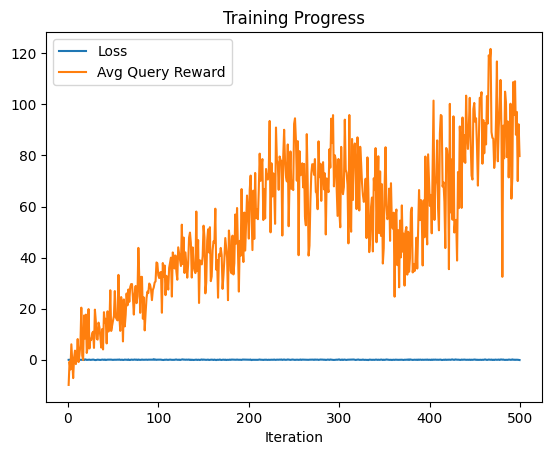

In [14]:
policy = train(inner_lr= 0.1,
               outer_lr= 0.001,
               meta_batch_size= 5,
               max_episode_len= 200,
               inner_steps= 1
)

In [24]:
env = HalfCheetahBackward()
evaluate(policy, env, num_episodes=10)

Mean Reward: 316.41167488079634


In [25]:
show_video('./Final_Evaluation.mp4')